In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import os
from pathlib import Path
import time
import copy

In [107]:
# Convenient IPython console
# comment it if you execute Jupyterlab on a remote server

%qtconsole --style monokai

In [3]:
# If you haven't properly installed tysserand, but its code is on your hard drive:
import sys
sys.path.extend(['../../tysserand']) # change directy

In [4]:
from tysserand import tysserand as ty

In [77]:
# from https://stackoverflow.com/a/39566040

SMALL_SIZE = 20
MEDIUM_SIZE = 20
BIGGER_SIZE = 25

mpl.rc('font', size=SMALL_SIZE)          # controls default text sizes
mpl.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
mpl.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
mpl.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
mpl.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
mpl.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
mpl.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

In [169]:
imdir = Path("../images")

## Delaunay triangulation

In [176]:
# With a small tissue network
img = plt.imread("../data/mIF_WSI_tile/tile.png")
nodes = pd.read_csv(r"../data/mIF_WSI_tile/nodes.csv", usecols=['x','y', 'marker'])

coords = nodes.loc[:,['x','y']].values
pairs = ty.build_delaunay(coords, trim_dist=False)
distances = ty.distance_neighbors(coords, pairs)

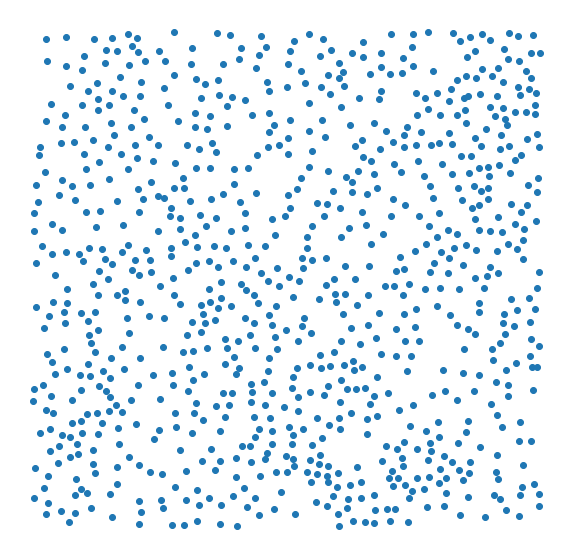

In [177]:
plt.figure(figsize=(10,10))
plt.scatter(coords[:,0], coords[:,1])
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - nodes positions'), bbox_inches=('tight'))

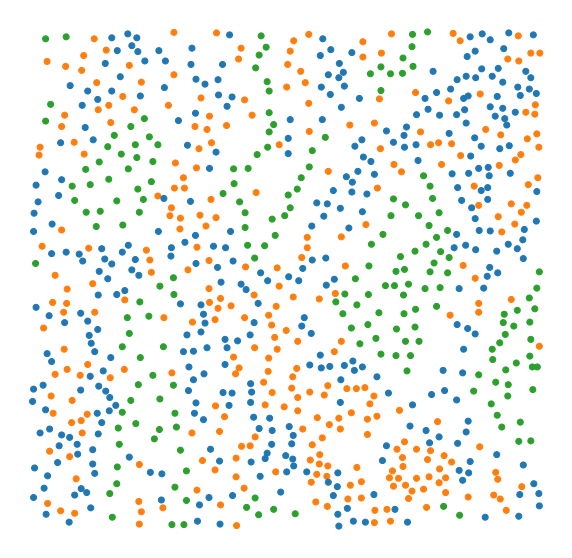

In [178]:
# make colors for nodes
# marker --> DAPI 5060C, FITC+TxRed-A-2, FITC+TxRed-A-1 
# class_colors --> orange, blue, green
class_colors = ['#ff7f0e', '#1f77b4', '#2ca02c']
classes = list(nodes['marker'].unique())
dico_col = {classes[0]:class_colors[0],
            classes[1]:class_colors[1],
            classes[2]:class_colors[2]}
colors = []
for cl in nodes['marker']:
    colors.append(dico_col[cl])

plt.figure(figsize=(10,10))
plt.scatter(coords[:,0], coords[:,1], c=colors)
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - nodes positions classes'), bbox_inches=('tight'))

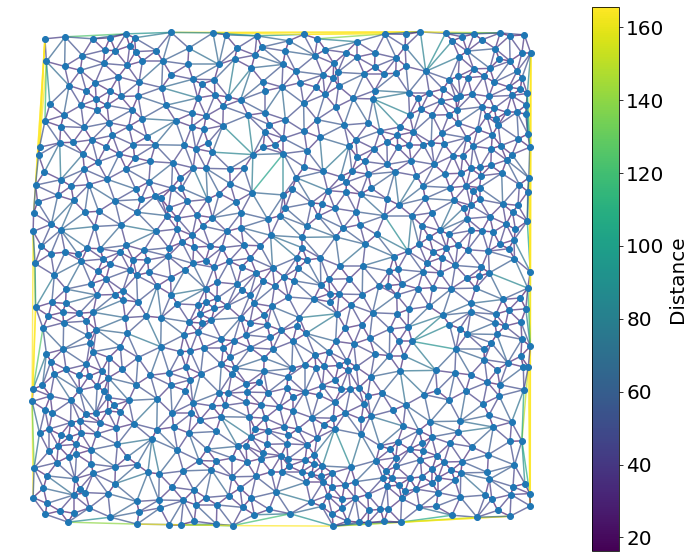

In [179]:
ty.plot_network_distances(coords, pairs, distances, figsize=(13,10))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - Delaunay distances'), bbox_inches=('tight'))

In [180]:
dist_threshold = 120
select = distances < dist_threshold
pairs = pairs[select,:]

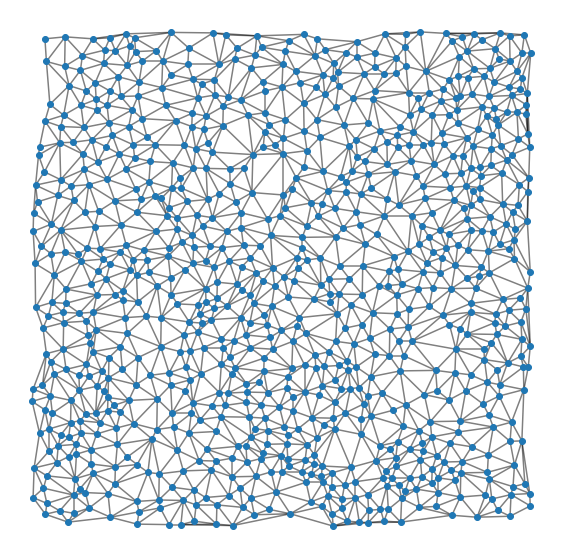

In [181]:
ty.plot_network(coords, pairs, figsize=(10,10))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - Delaunay network'), bbox_inches=('tight'))

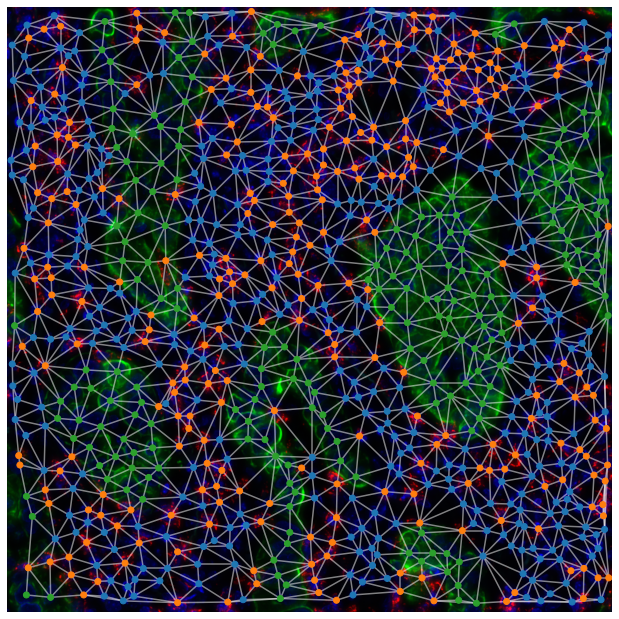

In [182]:
# superimpose network to mIF image
fig, ax = ty.showim(img)
ty.plot_network(coords, pairs, col_nodes=colors, col_edges='w', ax=ax)
plt.savefig(imdir.joinpath('mIF - Delaunay superimposed'), bbox_inches=('tight'))

## k-nearest neighbors

In [262]:
coords = nodes.loc[:,['x','y']].values
pairs = ty.build_knn(coords)
distances = ty.distance_neighbors(coords, pairs)

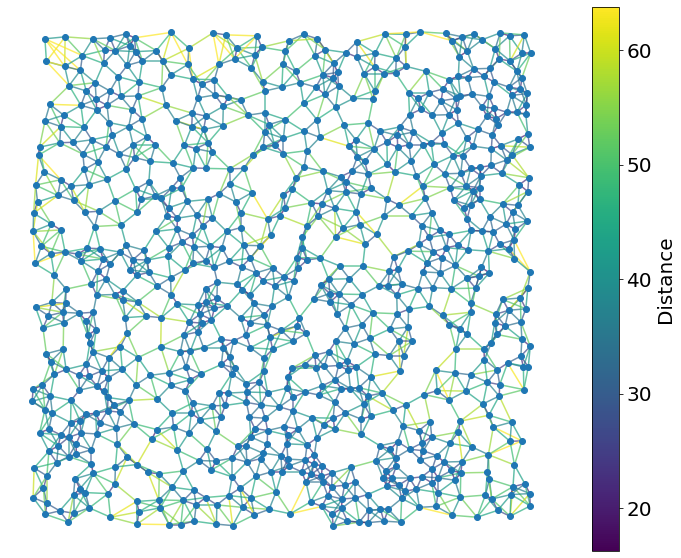

In [263]:
ty.plot_network_distances(coords, pairs, distances, figsize=(13,10))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - knn distances'), bbox_inches=('tight'))

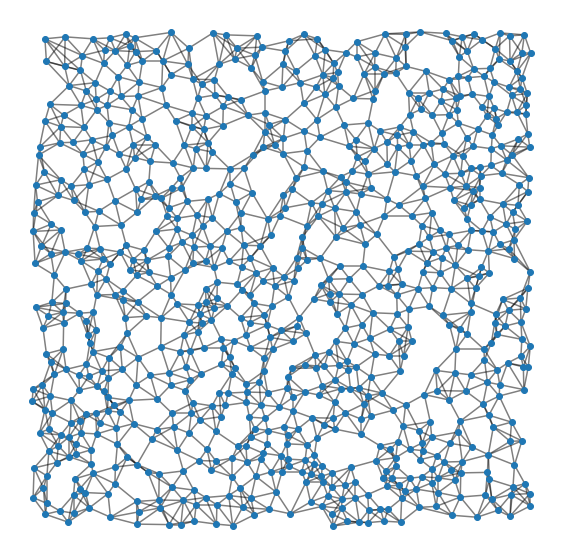

In [265]:
ty.plot_network(coords, pairs, figsize=(10,10))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - knn network'), bbox_inches=('tight'))

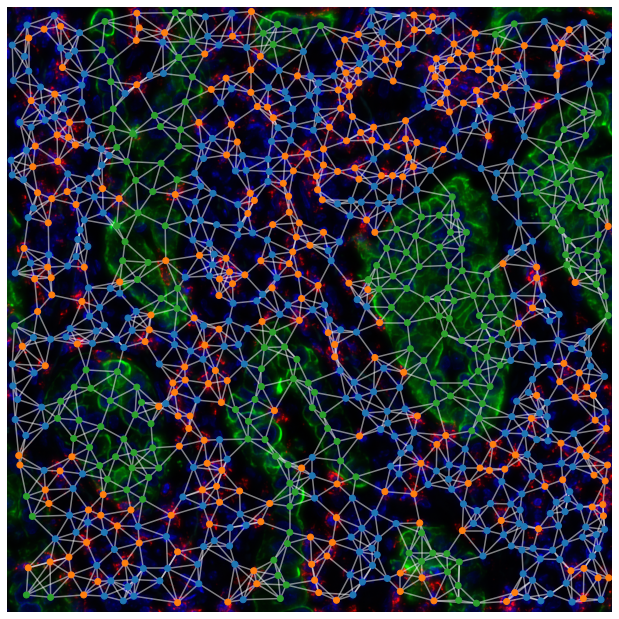

In [201]:
# superimpose network to mIF image
fig, ax = ty.showim(img)
ty.plot_network(coords, pairs, col_nodes=colors, col_edges='w', ax=ax)
plt.savefig(imdir.joinpath('mIF - knn superimposed'), bbox_inches=('tight'))

## radial distance neighbors

In [266]:
coords = nodes.loc[:,['x','y']].values
pairs = ty.build_rdn(coords, r=60)
distances = ty.distance_neighbors(coords, pairs)

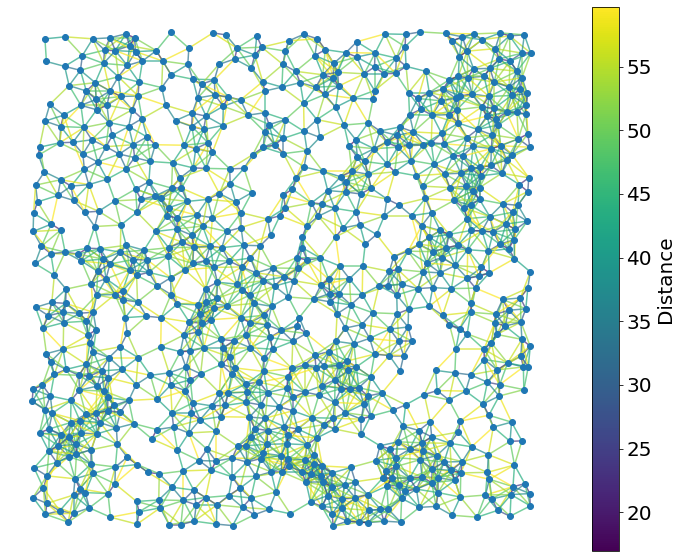

In [188]:
ty.plot_network_distances(coords, pairs, distances, figsize=(13,10))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - rdn distances'), bbox_inches=('tight'))

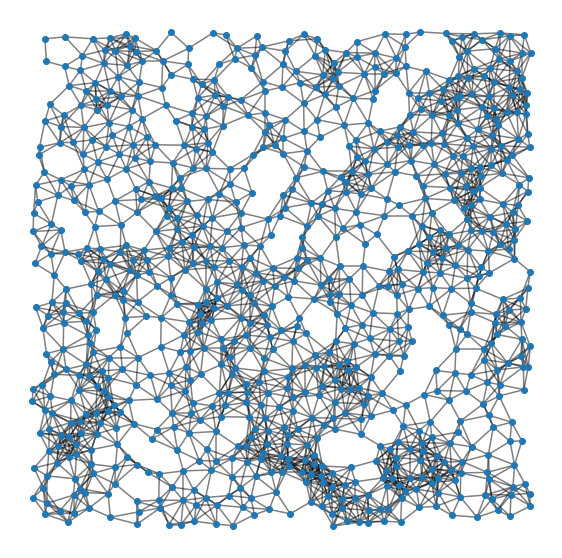

In [267]:
ty.plot_network(coords, pairs, figsize=(10,10))
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - rdn network'), bbox_inches=('tight'))

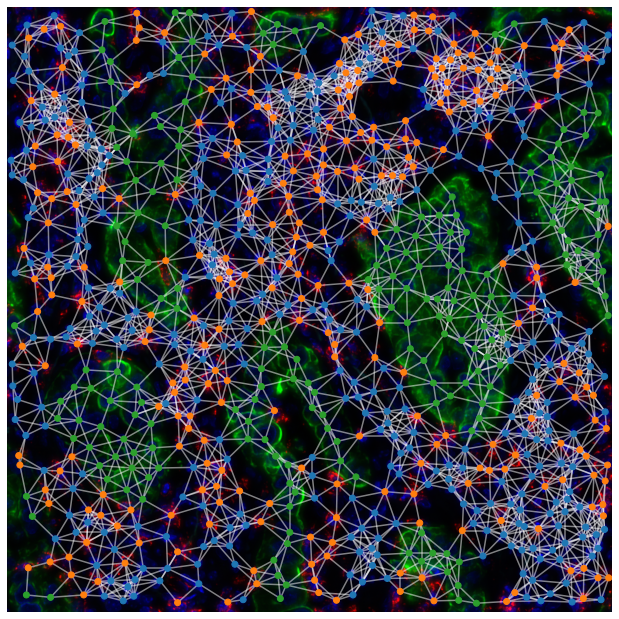

In [189]:
# superimpose network to mIF image
fig, ax = ty.showim(img)
ty.plot_network(coords, pairs, col_nodes=colors, col_edges='w', ax=ax)
plt.savefig(imdir.joinpath('mIF - rdn superimposed'), bbox_inches=('tight'))

## Performance comparison with PySAL

In [190]:
import libpysal
from libpysal.cg.voronoi  import voronoi, voronoi_frames
from libpysal.weights import Queen, Rook

### Exemple usage of PySAL on previous data

In [191]:
regions, vertices = voronoi(coords)
region_df, point_df = voronoi_frames(coords)

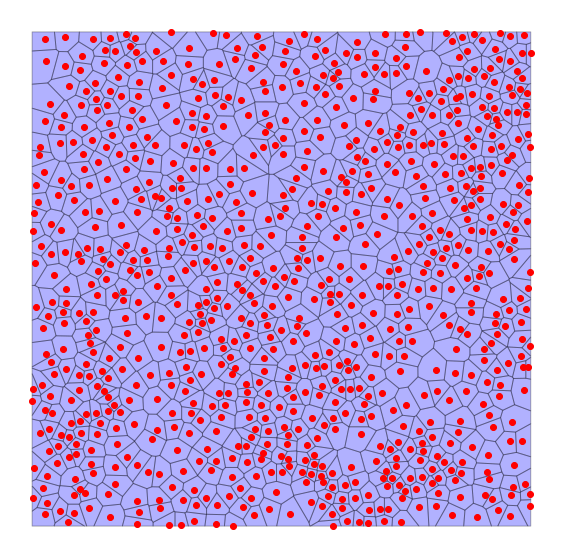

In [198]:
fig, ax = plt.subplots(figsize=(10,10))
region_df.plot(ax=ax, color='blue',edgecolor='black', alpha=0.3)
point_df.plot(ax=ax, color='red')
plt.axis('off')
plt.savefig(imdir.joinpath('mIF - PySALL Voronoi tessellation'), bbox_inches=('tight'))

In [193]:
w_rook = Rook.from_dataframe(point_df)

In [194]:
w_rook.n

858

In [195]:
w_rook.pct_nonzero

0.6694160540314387

In [196]:
gdf = region_df.join(pd.DataFrame({'dummy_var':np.zeros(region_df.shape[0])}))

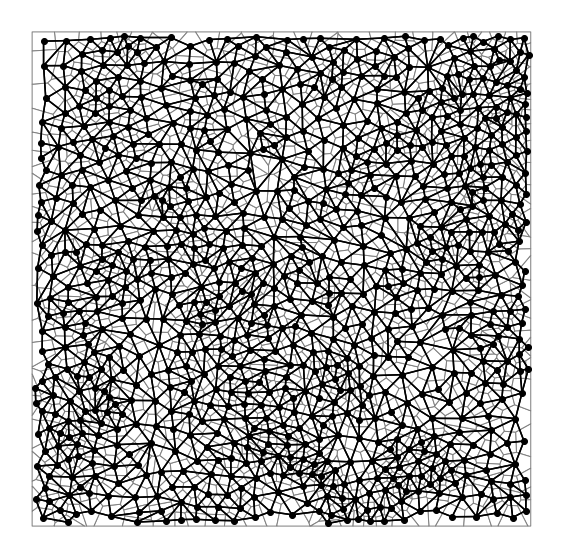

In [197]:
fig, ax = plt.subplots(figsize=(10,10))
ax = gdf.plot(edgecolor='grey', facecolor='w', ax=ax)
fig, ax = w_rook.plot(gdf, ax=ax)
ax.set_axis_off()
plt.savefig(imdir.joinpath('mIF - PySAL Voronoi network'), bbox_inches=('tight'))

In [42]:
# w_rook.neighbors

### Test with random data

In [47]:
bench_ty = {}
bench_ty_trim = {}
bench_sal = {}

In [63]:
sizes = [100, 300, 1000, 3000, 10000, 30000, 100000]
n_rep = 10
for size in sizes:
    print("benchmarking with {} nodes:".format(size), end=' ')
    time_ty = []
    time_ty_trim = []
    time_sal = []
    for n in range(n_rep):
        print('*', end='')
        coords = ty.make_random_nodes(size=size, ndim=2, expand=True)
        
        # time one run of tysserand Delaunay triangulation without automatic edge trimming
        tic = time.perf_counter()
        pairs = ty.build_delaunay(coords, trim_dist=False)
        toc = time.perf_counter()
        time_ty.append(toc-tic)
        
        # time one run of tysserand Delaunay triangulation with automatic edge trimming
        tic = time.perf_counter()
        pairs = ty.build_delaunay(coords)
        toc = time.perf_counter()
        time_ty_trim.append(toc-tic)
        
        # time one run of PySAL Voronoi tesselation
        tic = time.perf_counter()
        region_df, point_df = voronoi_frames(coords)
        w_rook = Rook.from_dataframe(point_df)
        toc = time.perf_counter()
        time_sal.append(toc-tic)
    print()
    bench_ty[size] = time_ty
    bench_ty_trim[size] = time_ty_trim
    bench_sal[size] = time_sal

benchmarking with 30000 nodes: **********
benchmarking with 100000 nodes: **********


In [94]:
mean_ty = []
mean_ty_trim = []
mean_sal = []
std_ty = []
std_ty_trim = []
std_sal = []

for key in bench_ty:
    mean_ty.append(np.mean(bench_ty[key]))
    mean_ty_trim.append(np.mean(bench_ty_trim[key]))
    mean_sal.append(np.mean(bench_sal[key]))
    std_ty.append(np.std(bench_ty[key]))
    std_ty_trim.append(np.std(bench_ty_trim[key]))
    std_sal.append(np.std(bench_sal[key]))

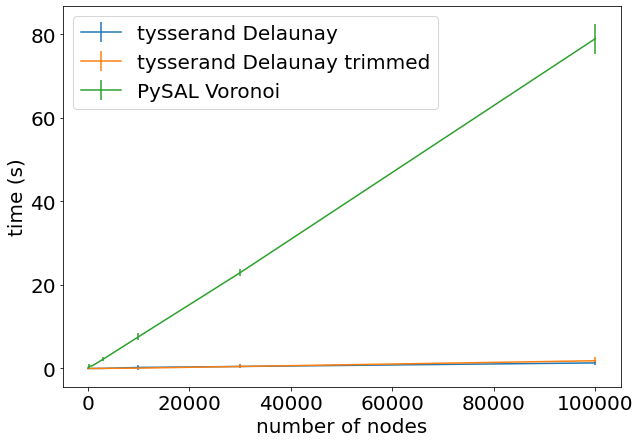

In [202]:
fig, ax = plt.subplots(figsize=(10,7))
plt.errorbar(sizes, mean_ty, yerr=std_ty, label='tysserand Delaunay')
plt.errorbar(sizes, mean_ty_trim, yerr=std_ty_trim, label='tysserand Delaunay trimmed')
plt.errorbar(sizes, mean_sal, yerr=std_sal, label='PySAL Voronoi')
plt.ylabel('time (s)')
plt.xlabel('number of nodes')
plt.legend()
plt.savefig(imdir.joinpath('benchmark tysserand PySAL'), bbox_inches=('tight'))

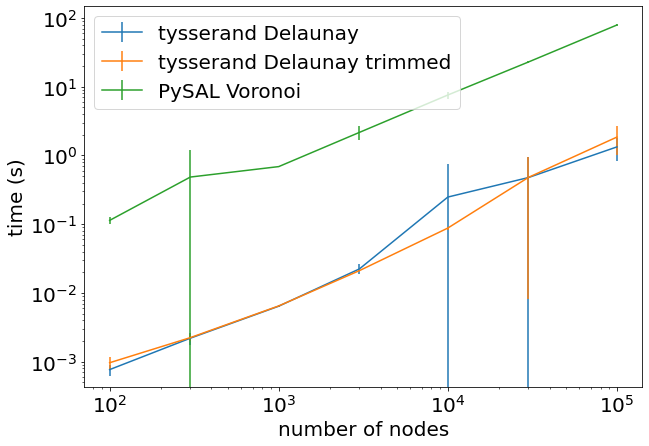

In [203]:
fig, ax = plt.subplots(figsize=(10,7))
plt.errorbar(sizes, mean_ty, yerr=std_ty, label='tysserand Delaunay')
plt.errorbar(sizes, mean_ty_trim, yerr=std_ty_trim, label='tysserand Delaunay trimmed')
plt.errorbar(sizes, mean_sal, yerr=std_sal, label='PySAL Voronoi')
plt.ylabel('time (s)')
plt.xlabel('number of nodes')
plt.legend()
ax.set_xscale('log')
ax.set_yscale('log')
plt.savefig(imdir.joinpath('benchmark tysserand PySAL - loglog'), bbox_inches=('tight'))

In [117]:
bench = pd.DataFrame(data={'tysserand': mean_ty,
                           'tysserand cleaned': mean_ty_trim,
                           'PySAL': mean_sal},
                     index=sizes)
bench.index.name = 'size'
bench['speed up'] = bench['PySAL'] / bench['tysserand']
bench['speed up cleaned'] = bench['PySAL'] / bench['tysserand cleaned']
bench

,tysserand,tysserand cleaned,PySAL,speed up,speed up cleaned
size,,,,,
100,0.000768,0.000966,0.113645,148.034723,117.606488
300,0.002198,0.002239,0.485246,220.728003,216.682907
1000,0.006422,0.006480,0.688802,107.249414,106.289580
3000,0.022372,0.021122,2.165721,96.805148,102.533815
10000,0.248272,0.087908,7.572632,30.501327,86.142551
30000,0.477656,0.480300,22.905057,47.953017,47.689068
100000,1.332263,1.851378,79.002224,59.299287,42.672127


In [118]:
print(bench.to_latex(float_format='%.3g')) 

\begin{tabular}{lrrrrr}
\toprule
{} &  tysserand &  tysserand cleaned &  PySAL &  speed up &  speed up cleaned \\
size   &            &                    &        &           &                   \\
\midrule
100    &   0.000768 &           0.000966 &  0.114 &       148 &               118 \\
300    &     0.0022 &            0.00224 &  0.485 &       221 &               217 \\
1000   &    0.00642 &            0.00648 &  0.689 &       107 &               106 \\
3000   &     0.0224 &             0.0211 &   2.17 &      96.8 &               103 \\
10000  &      0.248 &             0.0879 &   7.57 &      30.5 &              86.1 \\
30000  &      0.478 &               0.48 &   22.9 &        48 &              47.7 \\
100000 &       1.33 &               1.85 &     79 &      59.3 &              42.7 \\
\bottomrule
\end{tabular}



## Fake tissue generation

In [327]:
from importlib import reload
ty = reload(ty)

In [286]:
coords, masks, image = ty.make_random_tiles(nb=10, return_image=True, double_pattern=False)

Centers of generated cells

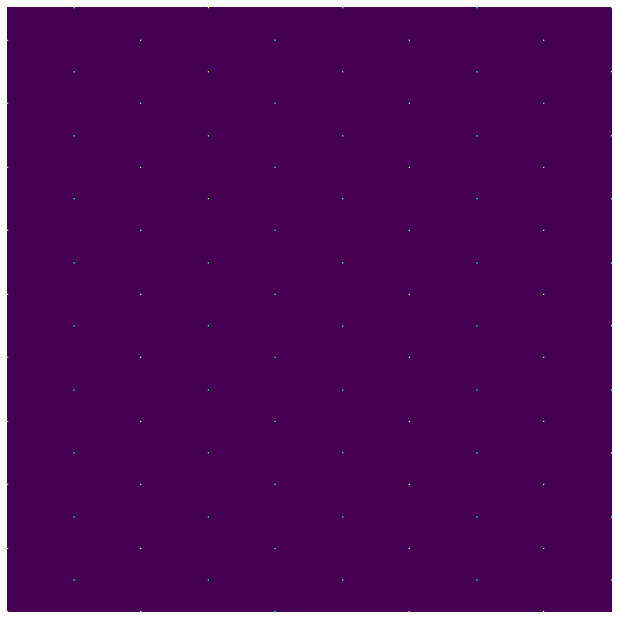

In [287]:
ty.showim(image, origin='lower')
plt.savefig(imdir.joinpath('generated-tissue-seeds'), bbox_inches=('tight'))

Masks are areas of a same integer, if there are K masks, image maximum is K

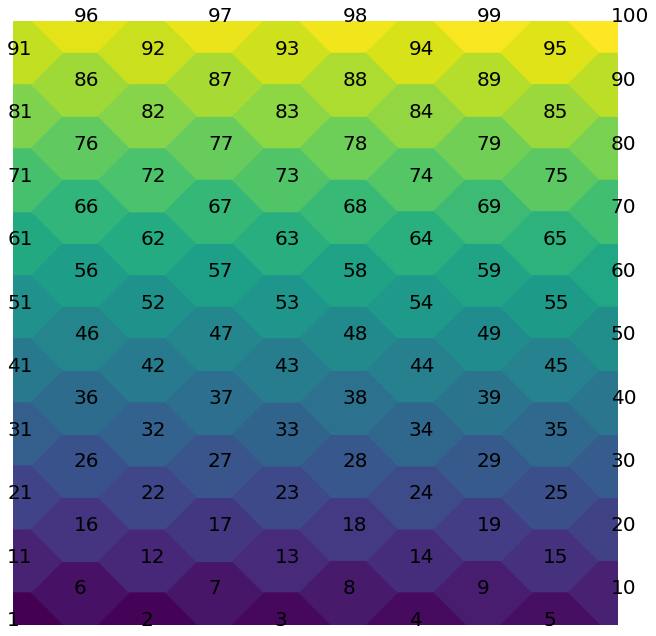

In [288]:
fig, ax = ty.showim(masks, origin='lower')
for (x,y) in coords:
    text = str(masks[y,x])
    plt.text(x-5, y, text, fontdict=None)
plt.savefig(imdir.joinpath('generated-tissue-interger-masks'), bbox_inches=('tight'))

The continuous colormap is misleading: adjacents masks are not distinguishable.  
We use scikit-image's label2rgb to distinguish neighboring masks

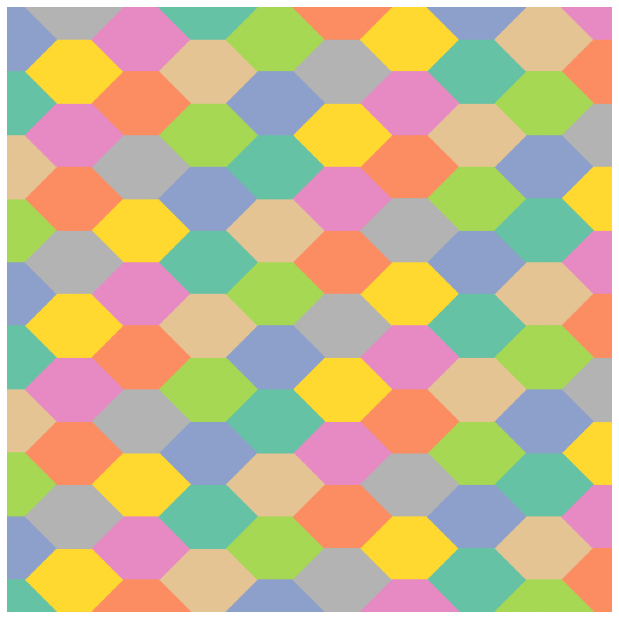

In [292]:
label_cmap = mpl.cm.get_cmap('Set2')(range(8))
from skimage import color
ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
plt.savefig(imdir.joinpath('generated-tissue-masks'), bbox_inches=('tight'))

In [293]:
pairs = ty.build_contacting(masks)
coords = ty.mask_val_coord(masks)
coords, pairs = ty.refactor_coords_pairs(coords, pairs)
distances = ty.distance_neighbors(coords, pairs)

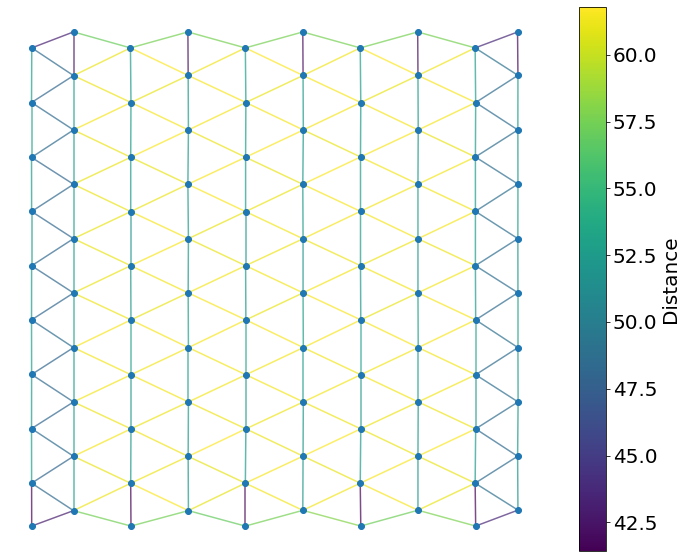

In [294]:
ty.plot_network_distances(coords, pairs, distances, figsize=(13,10))
plt.axis('off');
plt.savefig(imdir.joinpath('generated-tissue-cell-contact'), bbox_inches=('tight'))

In [298]:
linewidth = 3

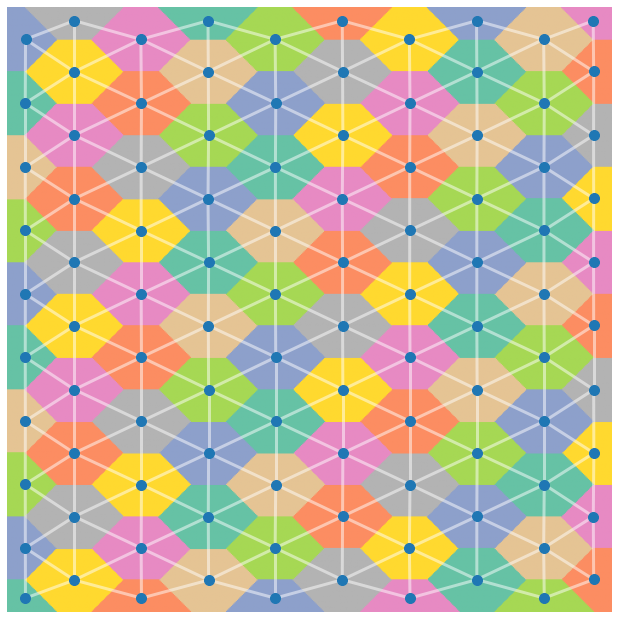

In [299]:
fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth)
plt.savefig(imdir.joinpath('generated-tissue-cell-contact-superimposition'), bbox_inches=('tight'))

### Coordinates methods on generated tissue

#### Delaunay

In [300]:
coords, masks = ty.make_random_tiles(nb=10)
pairs = ty.build_delaunay(coords, trim_dist=False)
distances = ty.distance_neighbors(coords, pairs)

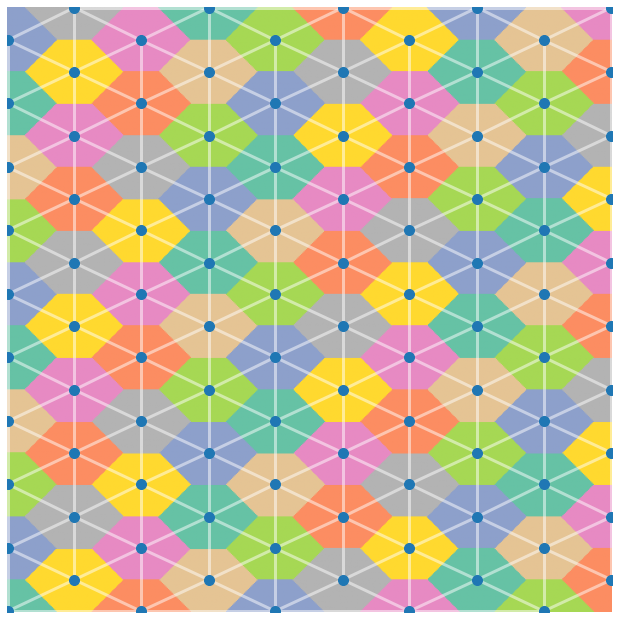

In [301]:
fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth)
plt.savefig(imdir.joinpath('generated-tissue-delaunay-superimposition'), bbox_inches=('tight'))

#### knn

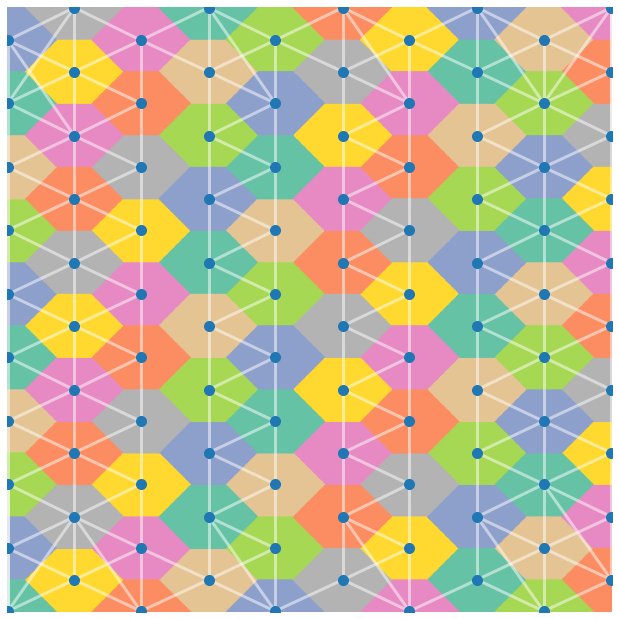

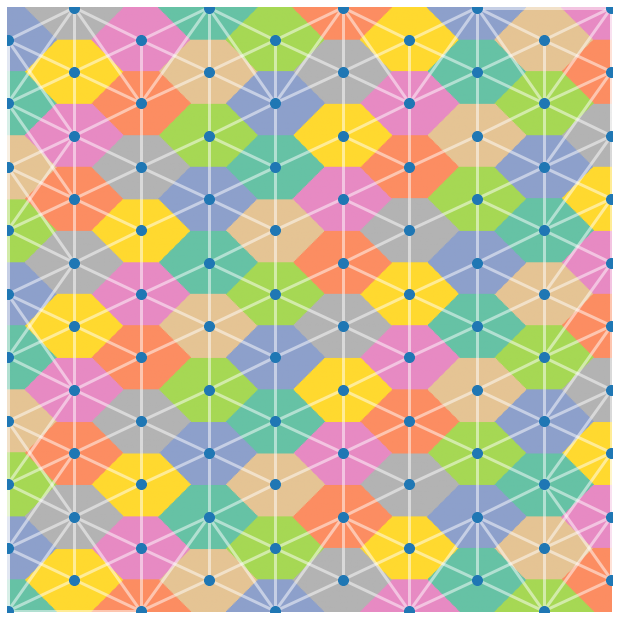

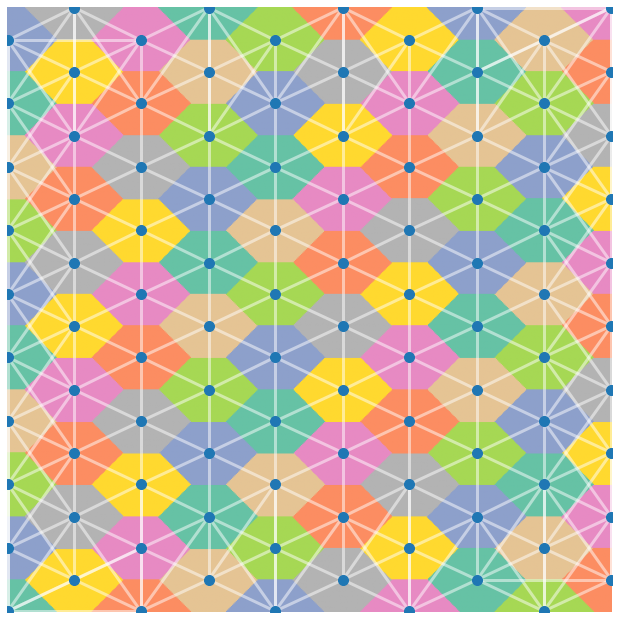

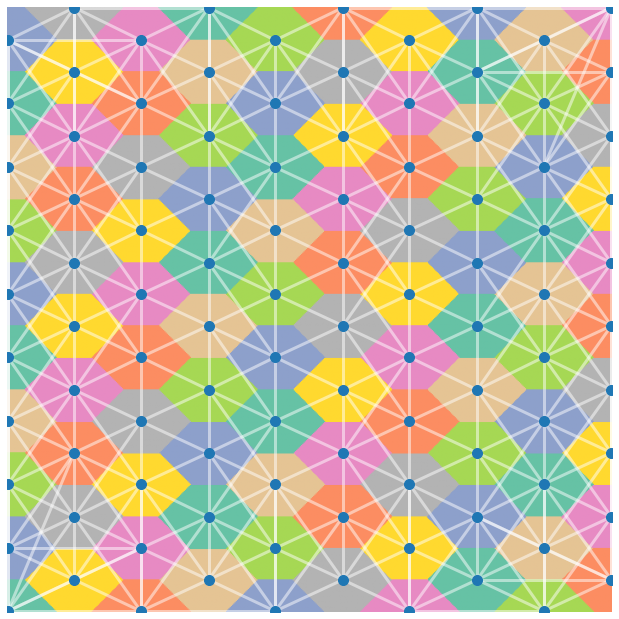

In [302]:
coords, masks = ty.make_random_tiles(nb=10)
for k in [5,6,7,8]:
    pairs = ty.build_knn(coords, k)
    fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
    ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth)
    plt.savefig(imdir.joinpath('generated-tissue-knn-superimposition_k='+str(k)), bbox_inches=('tight'))

#### rdn

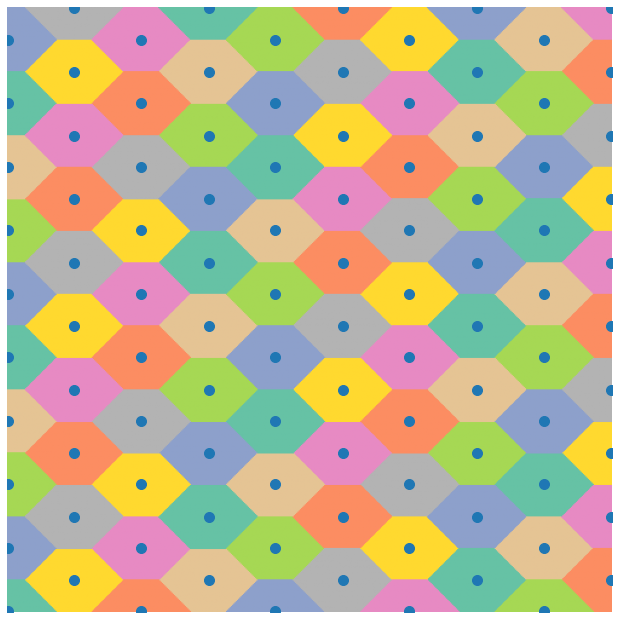

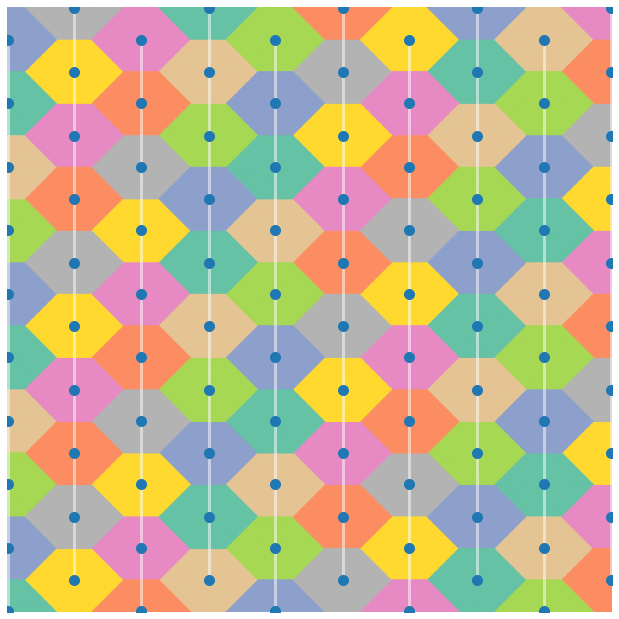

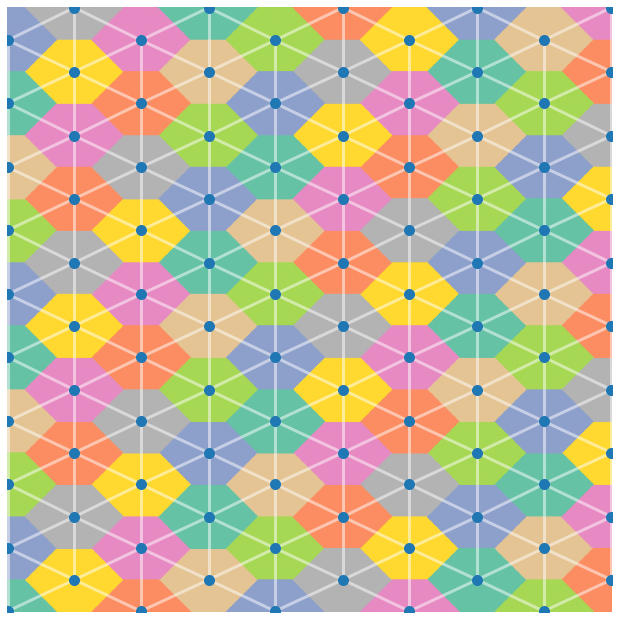

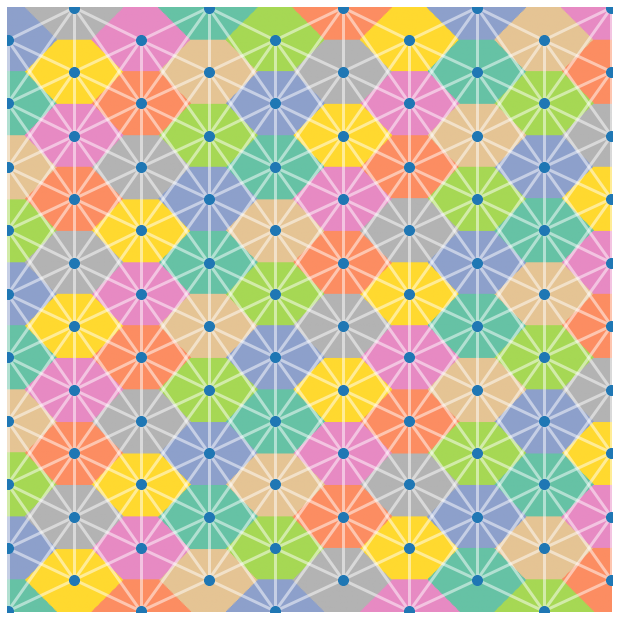

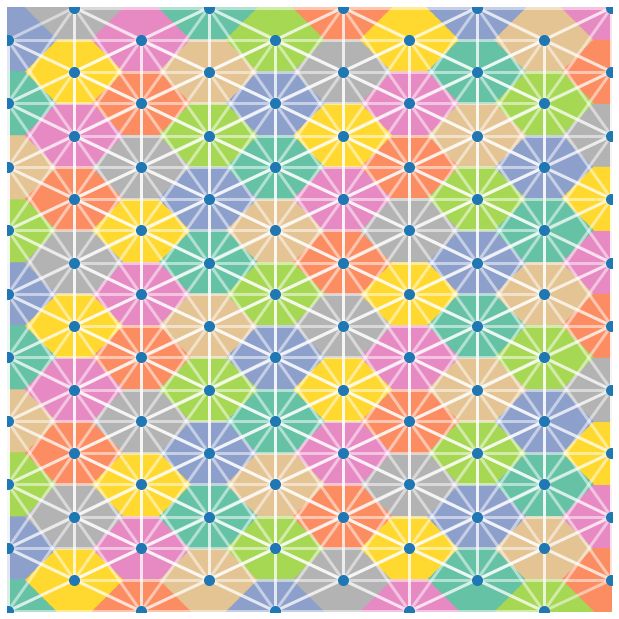

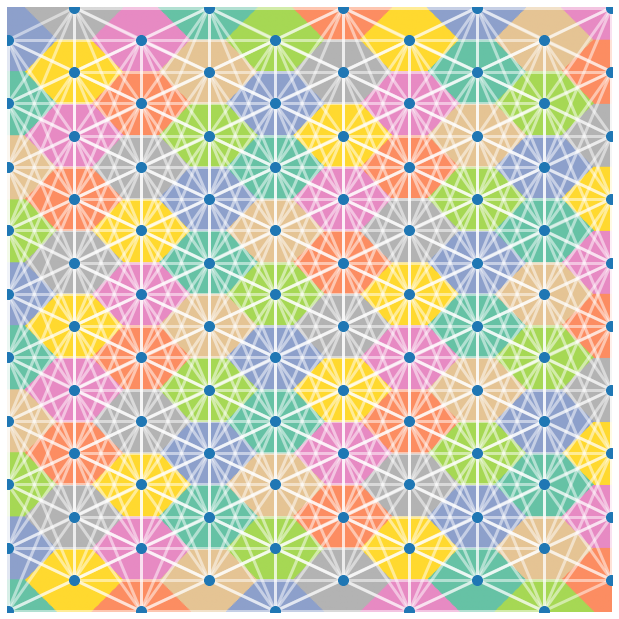

In [305]:
coords, masks = ty.make_random_tiles(nb=10)
for r in [50,55,75,100,125,150]:
    pairs = ty.build_rdn(coords, r)
    fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
    ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth);
    plt.savefig(imdir.joinpath('generated-tissue-rdn-superimposition_r='+str(r)), bbox_inches=('tight'))

#### rdn on tissue with noise

In [339]:
np.random.seed(0)
coords, masks, image = ty.make_random_tiles(nb=10, return_image=True, noise_sigma=10)

(<Figure size 648x648 with 1 Axes>, <AxesSubplot:>)

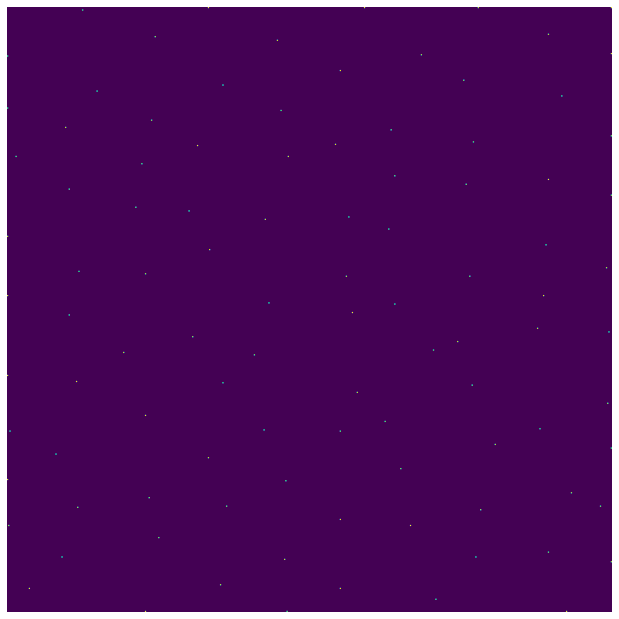

In [340]:
ty.showim(image, origin='lower')

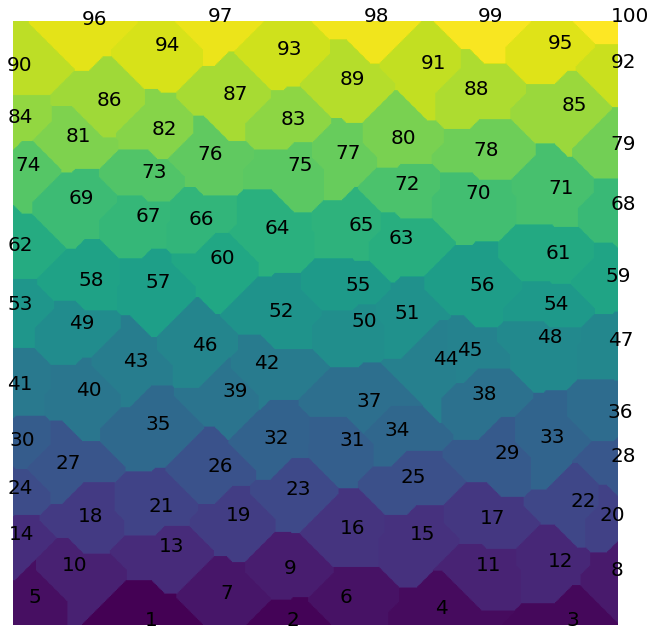

In [341]:
fig, ax = ty.showim(masks, origin='lower')
for (x,y) in coords:
    text = str(masks[y,x])
    plt.text(x-5, y, text, fontdict=None)
plt.savefig(imdir.joinpath('generated-tissue-interger-masks_noise-sigma'), bbox_inches=('tight'))

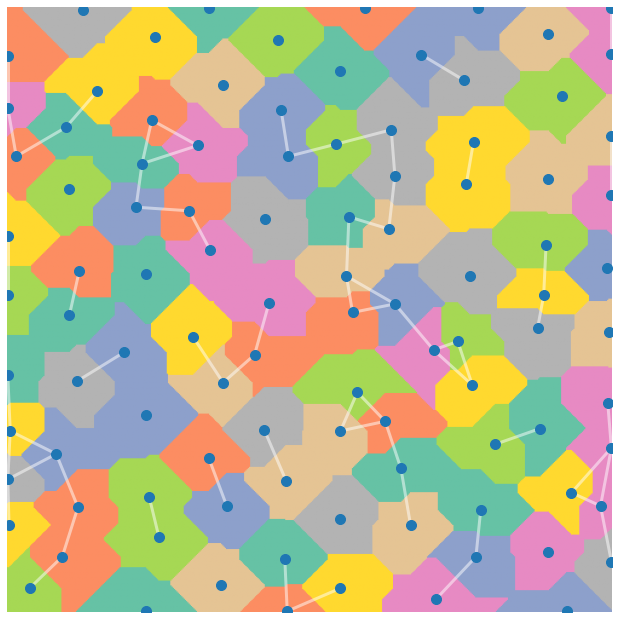

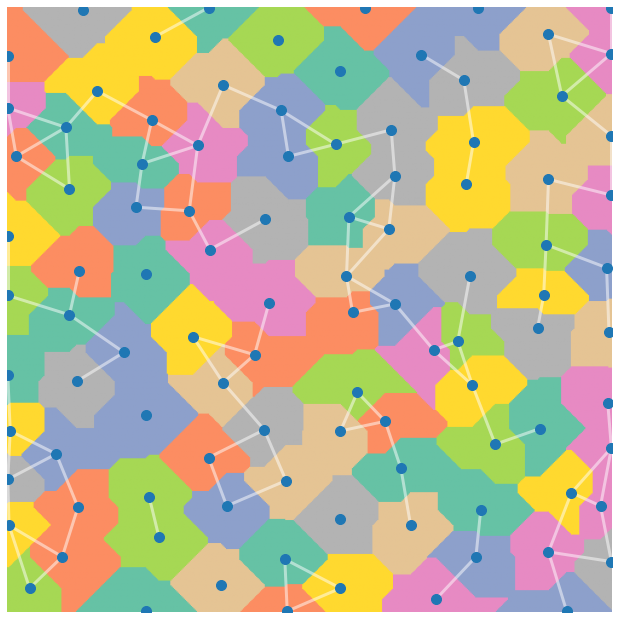

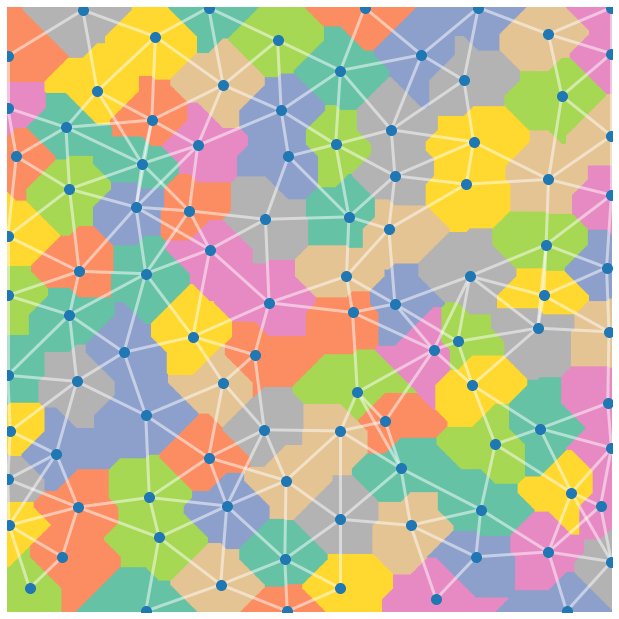

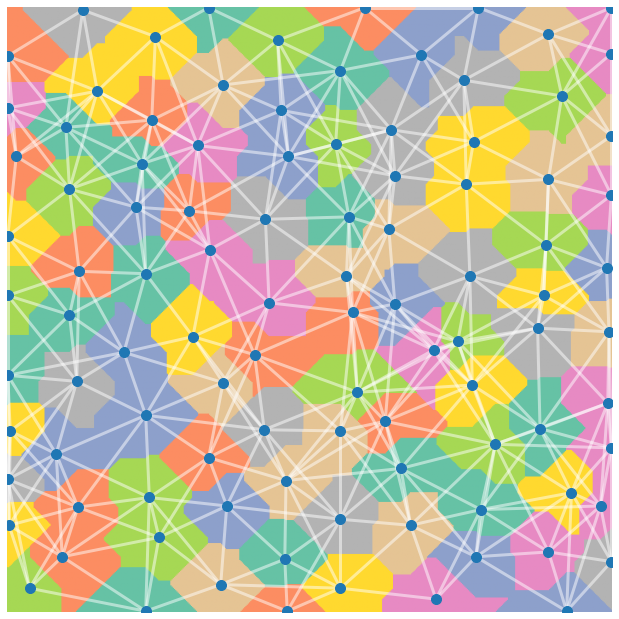

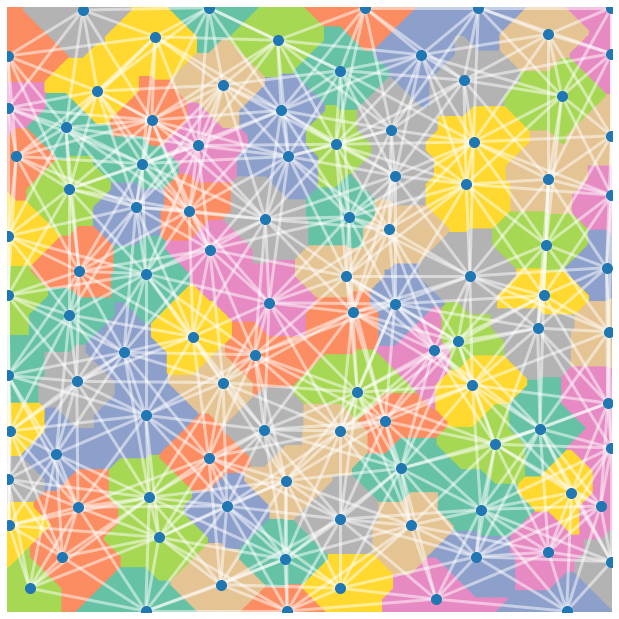

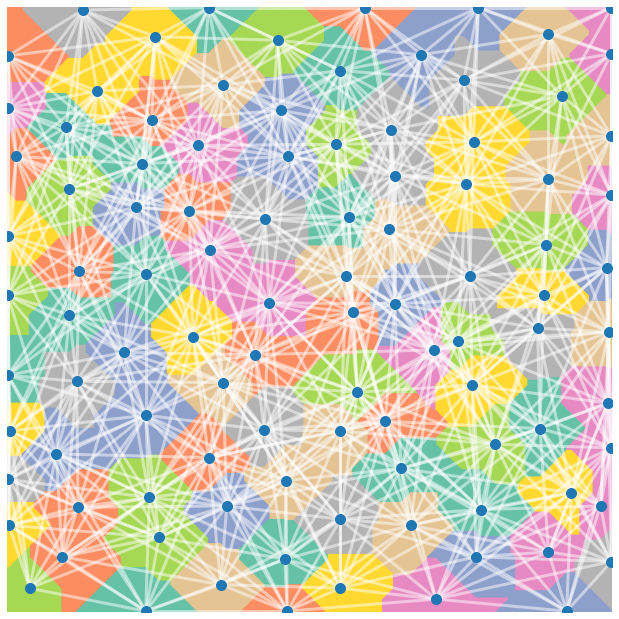

In [342]:
for r in [50,55,75,100,125,150]:
    pairs = ty.build_rdn(coords, r)
    fig, ax = ty.showim(color.label2rgb(masks, bg_label=0, colors=label_cmap), origin='lower')
    ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth);
    plt.savefig(imdir.joinpath('generated-tissue_noise-sigma_rdn-superimposition_r='+str(r)), bbox_inches=('tight'))